<a href="https://colab.research.google.com/github/PsorTheDoctor/generative-ai/blob/master/image_to_image/ghost.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#GHOST: Generative High-fidelity One Shot Transfer

In [ ]:
!git clone https://github.com/sberbank-ai/sber-swap.git
%cd sber-swap

# load arcface
!wget -P ./arcface_model https://github.com/sberbank-ai/sber-swap/releases/download/arcface/backbone.pth
!wget -P ./arcface_model https://github.com/sberbank-ai/sber-swap/releases/download/arcface/iresnet.py
# load landmarks detector
!wget -P ./insightface_func/models/antelope https://github.com/sberbank-ai/sber-swap/releases/download/antelope/glintr100.onnx
!wget -P ./insightface_func/models/antelope https://github.com/sberbank-ai/sber-swap/releases/download/antelope/scrfd_10g_bnkps.onnx
# load model itself
!wget -P ./weights https://github.com/sberbank-ai/sber-swap/releases/download/sber-swap-v2.0/G_unet_2blocks.pth
# load super res model
!wget -P ./weights https://github.com/sberbank-ai/sber-swap/releases/download/super-res/10_net_G.pth

In [ ]:
!pip install -q mxnet-cu112
!pip install -q onnxruntime-gpu==1.12
!pip install -q insightface==0.2.1
!pip install -q kornia==0.5.4
!pip install -q dill

#change the path to python in case you use a different version
!rm /usr/local/lib/python3.10/dist-packages/insightface/model_zoo/model_zoo.py
!wget -P /usr/local/lib/python3.10/dist-packages/insightface/model_zoo/ https://github.com/AlexanderGroshev/insightface/releases/download/model_zoo/model_zoo.py

In [ ]:
import cv2
import torch
import time
import os

from utils.inference.image_processing import crop_face, get_final_image, show_images
from utils.inference.video_processing import (
    read_video, get_target, get_final_video, add_audio_from_another_video, face_enhancement
)
from utils.inference.core import model_inference

from network.AEI_Net import AEI_Net
from coordinate_reg.image_infer import Handler
from insightface_func.face_detect_crop_multi import Face_detect_crop
from arcface_model.iresnet import iresnet100
from models.pix2pix_model import Pix2PixModel
from models.config_sr import TestOptions
import warnings
warnings.filterwarnings('ignore')

##Initialize models

In [4]:
app = Face_detect_crop(name='antelope', root='./insightface_func/models')
app.prepare(ctx_id= 0, det_thresh=0.6, det_size=(640, 640))

# main model for generation
G = AEI_Net(backbone='unet', num_blocks=2, c_id=512)
G.eval()
G.load_state_dict(torch.load('weights/G_unet_2blocks.pth', map_location=torch.device('cpu')))
G = G.cuda()
G = G.half()

# arcface model to get face embedding
netArc = iresnet100(fp16=False)
netArc.load_state_dict(torch.load('arcface_model/backbone.pth'))
netArc=netArc.cuda()
netArc.eval()

# model to get face landmarks
handler = Handler('./coordinate_reg/model/2d106det', 0, ctx_id=0, det_size=640)

# model to make superres of face, set use_sr=True if you want to use super resolution
# or use_sr=False if you don't
use_sr = True
if use_sr:
  os.environ['CUDA_VISIBLE_DEVICES'] = '0'
  torch.backends.cudnn.benchmark = True
  opt = TestOptions()
  # opt.which_epoch ='10_7'
  model = Pix2PixModel(opt)
  model.netG.train()

input mean and std: 127.5 127.5
find model: ./insightface_func/models/antelope/glintr100.onnx recognition
find model: ./insightface_func/models/antelope/scrfd_10g_bnkps.onnx detection
set det-size: (640, 640)
loading ./coordinate_reg/model/2d106det 0
input mean and std: 127.5 127.5
find model: ./insightface_func/models/antelope/glintr100.onnx recognition
find model: ./insightface_func/models/antelope/scrfd_10g_bnkps.onnx detection
set det-size: (640, 640)
Network [LIPSPADEGenerator] was created. Total number of parameters: 72.2 million. To see the architecture, do print(network).
Load checkpoint from path:  weights/10_net_G.pth


In [ ]:
# from google.colab import files
# uploaded = files.upload()

In [30]:
target_type = 'video'  # 'image'
source_path = 'examples/images/adam.jpg'
target_path = 'examples/images/andrew.jpg'
path_to_video = 'examples/videos/ironman.mp4'

source_full = cv2.imread(source_path)
OUT_VIDEO_NAME = "examples/results/result.mp4"
crop_size = 224  # don't change this

# check if we can detect face on the source image
try:
  source = crop_face(source_full, app, crop_size)[0]
  source = [source[:, :, ::-1]]
  print("Everything is ok!")
except TypeError:
  print("Bad source images")

# read video
if target_type == 'image':
  target_full = cv2.imread(target_path)
  full_frames = [target_full]
else:
  full_frames, fps = read_video(path_to_video)

target = get_target(full_frames, app, crop_size)

Everything is ok!


##Inference

In [ ]:
batch_size = 40
START_TIME = time.time()

final_frames_list, crop_frames_list, full_frames, tfm_array_list = model_inference(
    full_frames, source, target, netArc, G, app, set_target=False,
    crop_size=crop_size, BS=batch_size
)
if use_sr:
  final_frames_list = face_enhancement(final_frames_list, model)

if target_type == 'video':
  get_final_video(
      final_frames_list, crop_frames_list, full_frames, tfm_array_list,
      OUT_VIDEO_NAME, fps, handler
  )
  add_audio_from_another_video(path_to_video, OUT_VIDEO_NAME, 'audio')

  print(f'Full pipeline took {time.time() - START_TIME}')
  print(f'Video saved with path {OUT_VIDEO_NAME}')
else:
  result = get_final_image(
      final_frames_list, crop_frames_list, full_frames[0], tfm_array_list, handler
  )
  cv2.imwrite('examples/results/result.png', result)

##Visualize

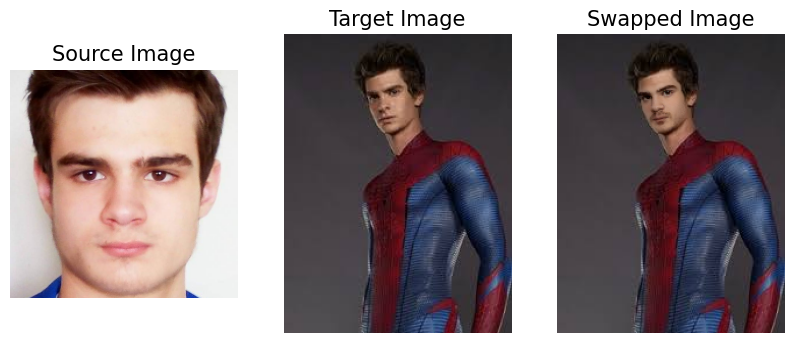

In [22]:
import matplotlib.pyplot as plt

show_images(
  [source[0][:, :, ::-1], target_full, result],
  ['Source Image', 'Target Image', 'Swapped Image'],
  figsize=(10, 4)
)

In [32]:
from IPython.display import HTML
from base64 import b64encode

video_file = open(OUT_VIDEO_NAME, "r+b").read()
video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"

HTML(f"""<video width={800} controls><source src="{video_url}"></video>""")